## Helmet Detection using YOLO11.

In [1]:
!nvidia-smi

Wed Jan 15 18:26:03 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Step 01 # Install the Ultralytics Package

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.9/906.9 kB 49.5 MB/s eta 0:00:00


## Step 02 # Import All the Requried Libraries

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.7/112.6 GB disk)


In [4]:
from ultralytics import YOLO
from IPython.display import Image

## Step # 03 Download Dataset from Roboflow

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ZkNMlNnyIa2y7w8zGWMS")
project = rf.workspace("yolo-do-it-yhopz").project("helmet-detector-9rzmg-bmd6q")
version = project.version(1)
dataset = version.download("yolov11")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.0 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Helmet-Detector-1 in yolov11:: 100%|██████████| 5696/5696 [00:01<00:00, 4223.95it/s]


In [6]:
dataset.location

'/content/Helmet-Detector-1'

## Step # 04 Train YOLO11 Model on a Custom Dataset

In [7]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=10 imgsz=640

100% 5.35M/5.35M [00:00<00:00, 316MB/s]
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/Helmet-Detector-1/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

## Step # 05 Examine Training Results

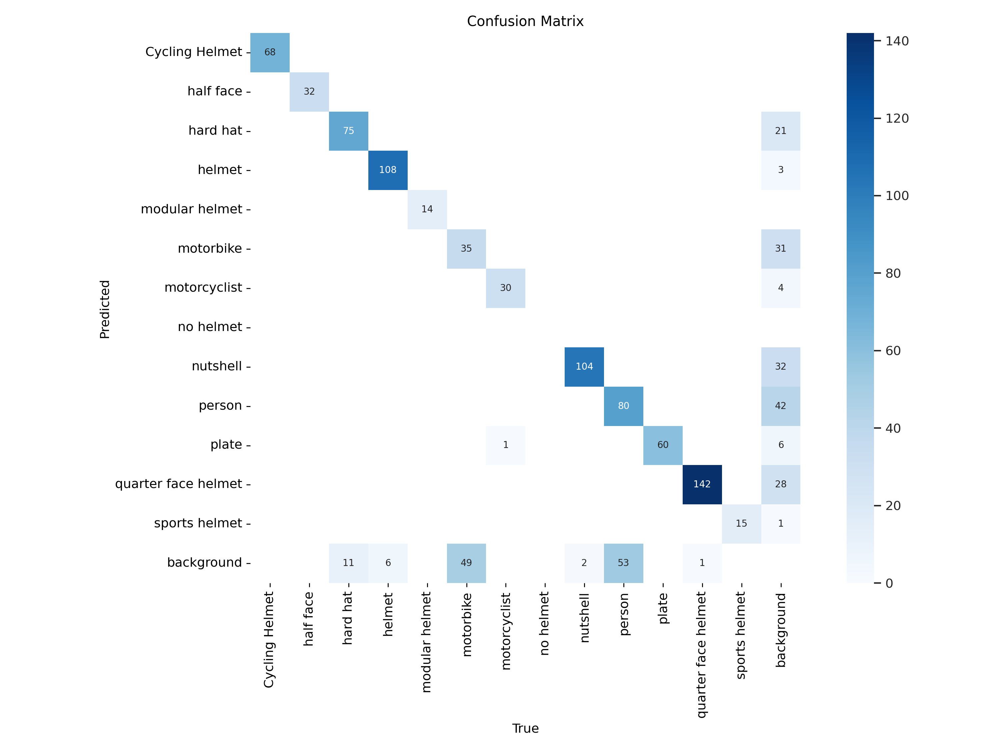

In [18]:
Image("/content/runs/detect/train/confusion_matrix.png", width=1000)

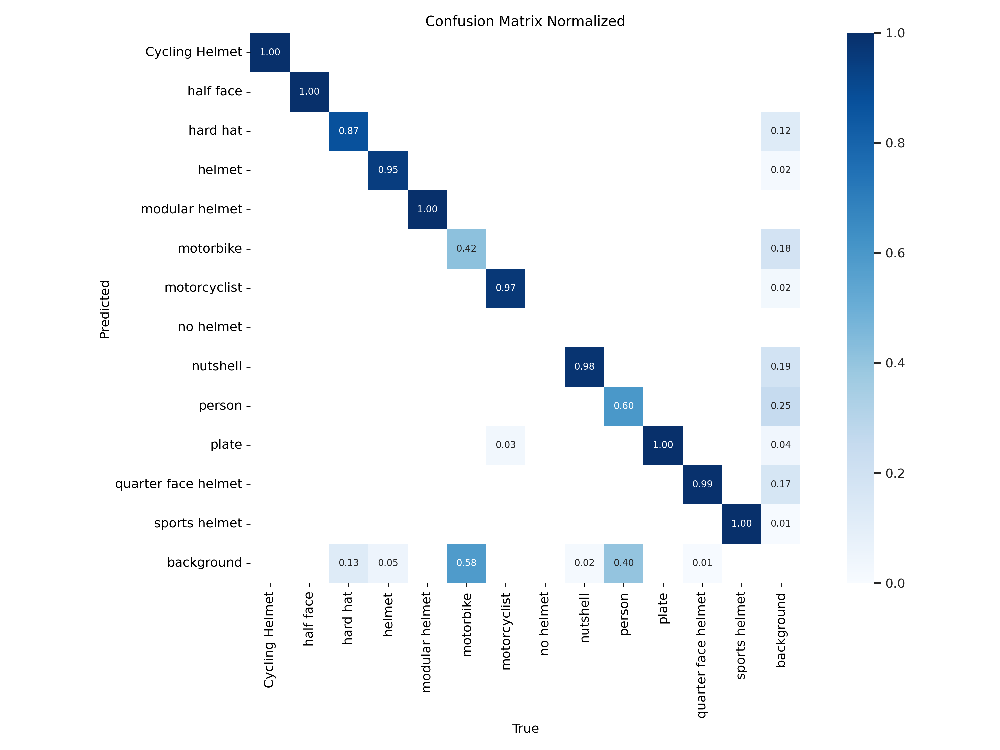

In [19]:
Image("/content/runs/detect/train/confusion_matrix_normalized.png", width=1000)

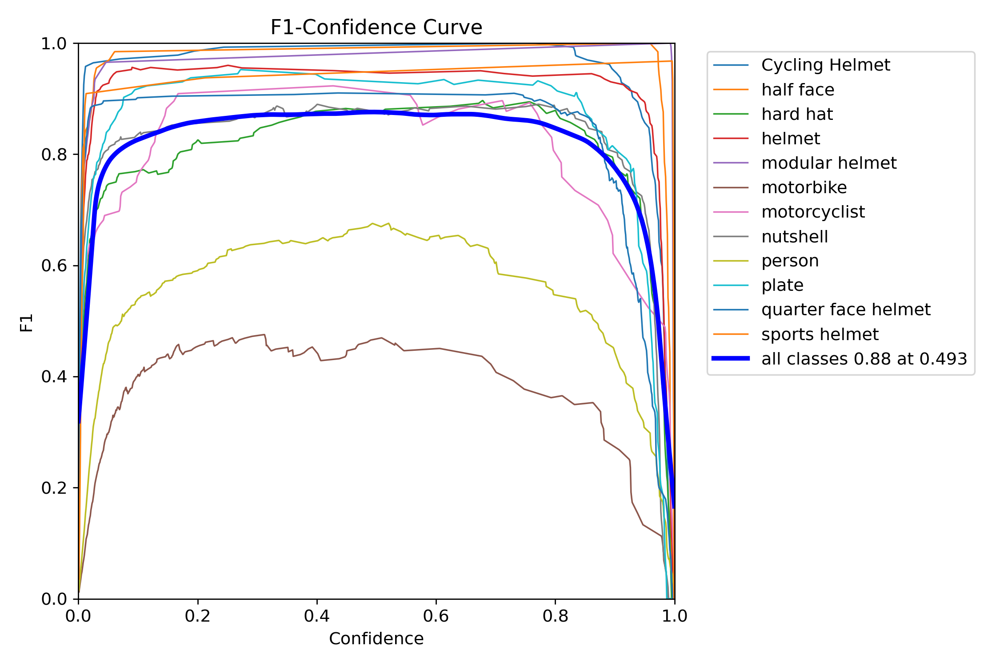

In [20]:
Image("/content/runs/detect/train/F1_curve.png", width=1000)

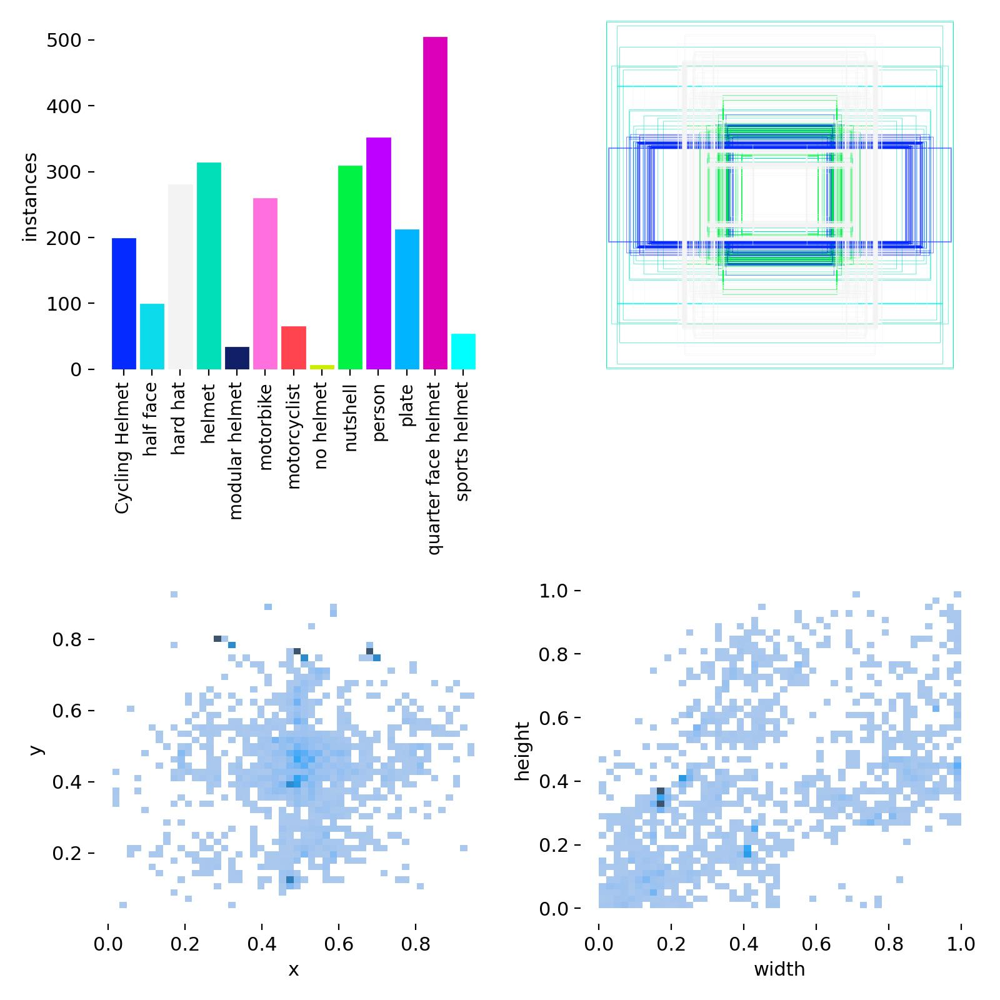

In [21]:
Image("/content/runs/detect/train/labels.jpg", width=1000)

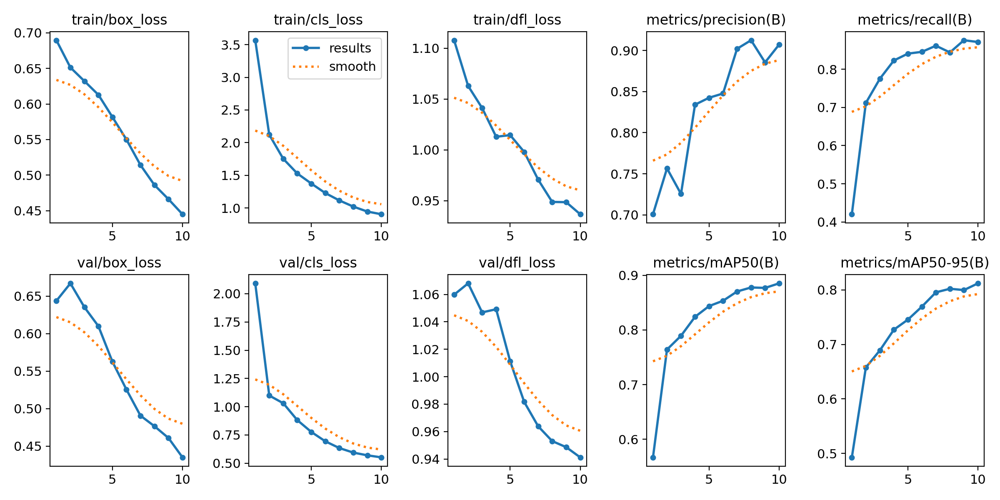

In [22]:
Image("/content/runs/detect/train/results.png", width=1000)

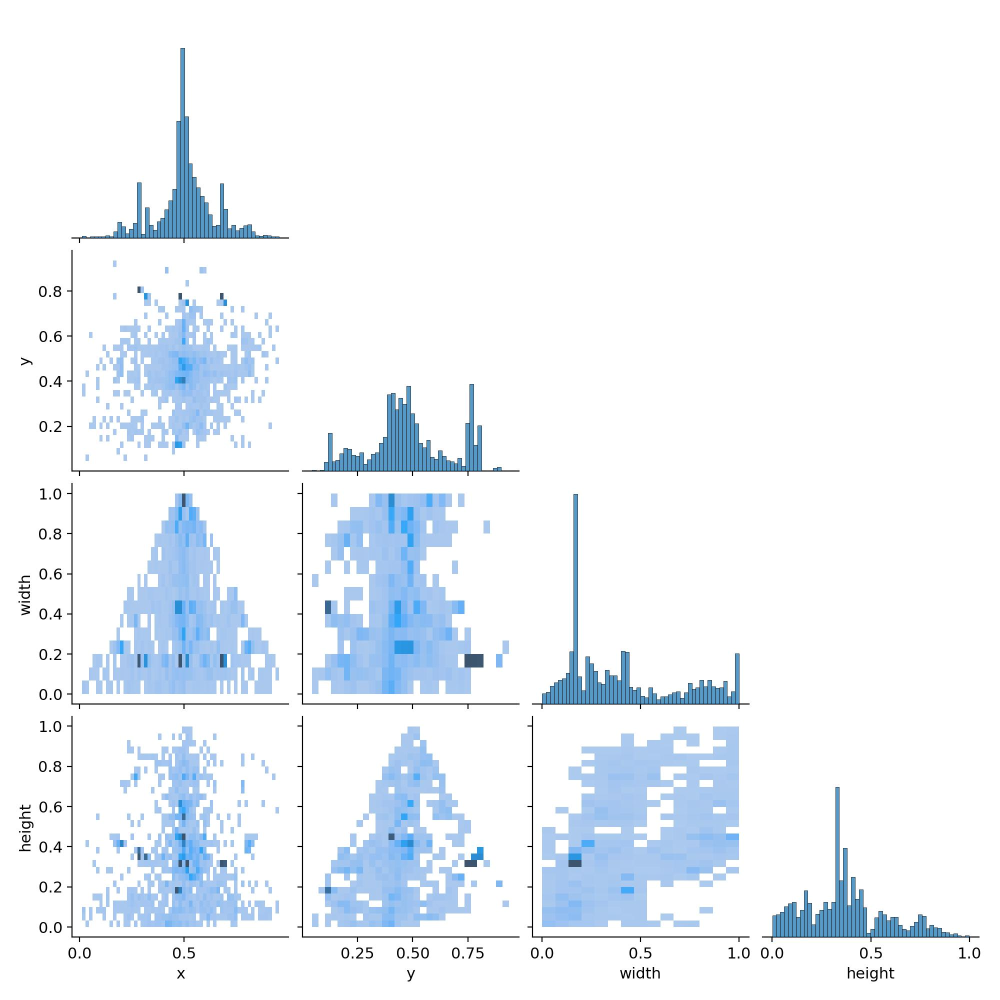

In [23]:
Image("/content/runs/detect/train/labels_correlogram.jpg", width=1000)

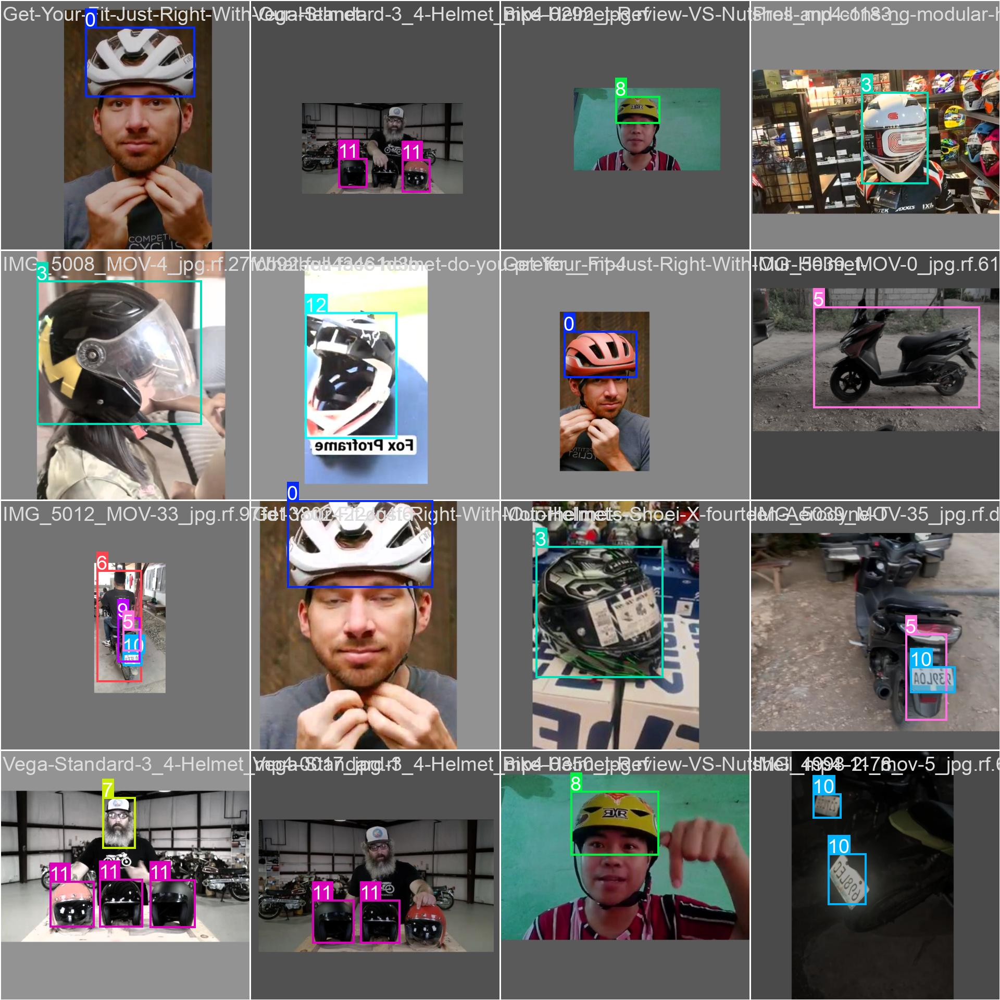

In [24]:
Image("/content/runs/detect/train/train_batch1.jpg", width=1000)

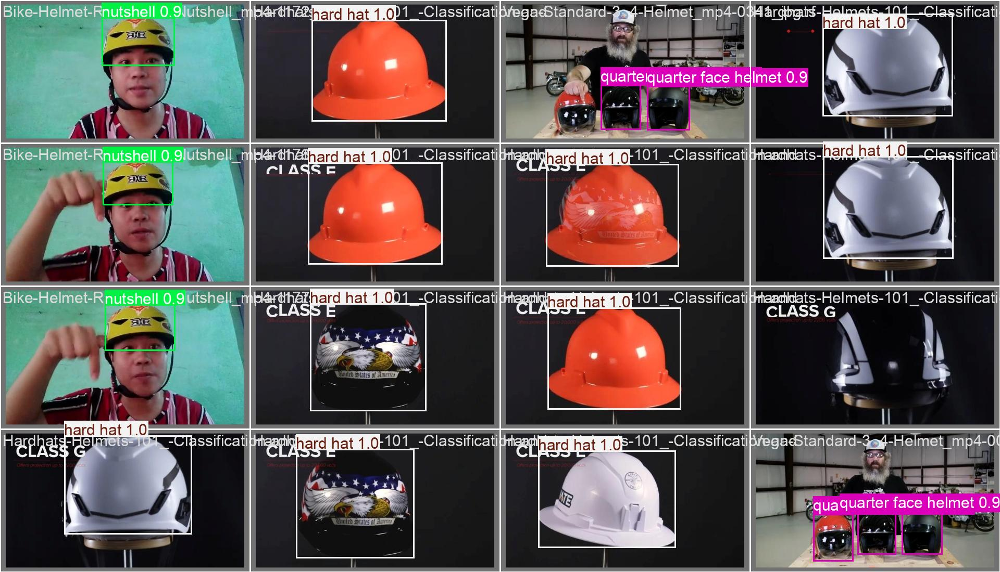

In [25]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=1000)

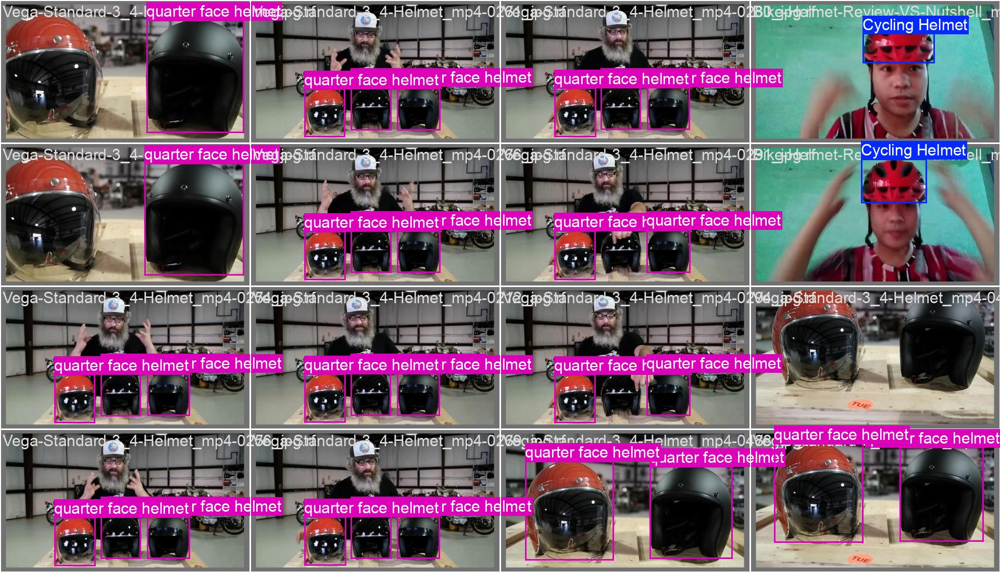

In [26]:
Image("/content/runs/detect/train/val_batch2_labels.jpg", width=1000)

## Step # 08 Inference with Custom Model on Images

In [27]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,584,687 parameters, 0 gradients, 6.3 GFLOPs

image 1/568 /content/Helmet-Detector-1/test/images/100-Trajecta-MTB-full-face-helmet-_mp4-0178_jpg.rf.40daedd08d8ee073d606a4e59773f75d.jpg: 640x384 1 sports helmet, 52.6ms
image 2/568 /content/Helmet-Detector-1/test/images/100-Trajecta-MTB-full-face-helmet-_mp4-0179_jpg.rf.53fbc18ec2d3dbc33fa2ca90fe4d27f6.jpg: 640x384 1 sports helmet, 9.0ms
image 3/568 /content/Helmet-Detector-1/test/images/100-Trajecta-MTB-full-face-helmet-_mp4-0186_jpg.rf.4b0cfc853a5cddb12cc069cd568ee13f.jpg: 640x384 1 sports helmet, 8.4ms
image 4/568 /content/Helmet-Detector-1/test/images/100-Trajecta-MTB-full-face-helmet-_mp4-0199_jpg.rf.ab2c103b611fa0377e8d8833d0d99e72.jpg: 640x384 1 sports helmet, 8.3ms
image 5/568 /content/Helmet-Detector-1/test/images/100-Trajecta-MTB-full-face-helmet-_mp4-0202_jpg.rf.ff6838cf4838f7bbf9cd1d75488bceaf.jpg: 640x384 1

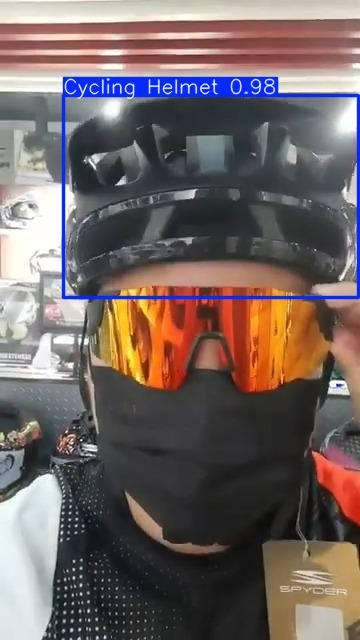

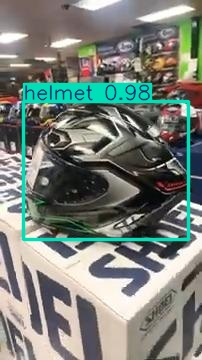

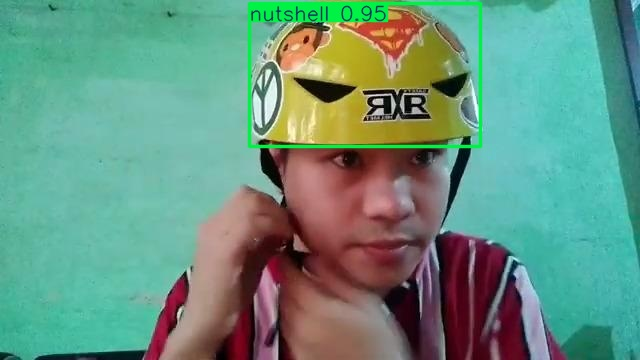

In [28]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

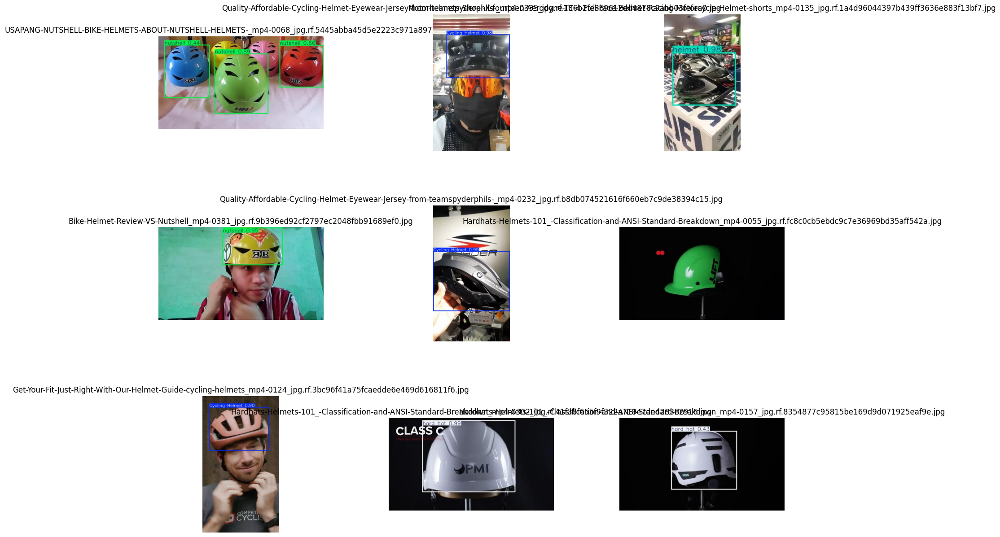

In [29]:
import glob
import os
import matplotlib.pyplot as plt
from IPython.display import display

# Find the latest folder
latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)

# Get the first 9 images (3 rows × 3 columns)
images = glob.glob(f'{latest_folder}/*.jpg')[:9]

# Plot images in 3 rows and 3 columns
fig, axes = plt.subplots(3, 3, figsize=(18, 15))  # Larger figsize for bigger images
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Add spacing between images

for ax, img_path in zip(axes.flatten(), images):
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.axis('off')  # Hide axis
    ax.set_title(os.path.basename(img_path), fontsize=12)  # Set title as image name with larger font

plt.show()

In [30]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/helemt1.jpeg save=True

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,584,687 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/helemt1.jpeg: 480x640 (no detections), 75.0ms
Speed: 4.3ms preprocess, 75.0ms inference, 70.5ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


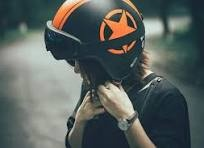

In [31]:
Image("/content/runs/detect/predict2/helemt1.jpg", width=600)

## Step # 08 Inference with Custom Model on Videos

In [33]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source="/content/helmet.mp4" save=True

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,584,687 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/224) /content/helmet.mp4: 384x640 2 motorbikes, 46.4ms
video 1/1 (frame 2/224) /content/helmet.mp4: 384x640 6 motorbikes, 1 person, 12.5ms
video 1/1 (frame 3/224) /content/helmet.mp4: 384x640 2 motorbikes, 13.2ms
video 1/1 (frame 4/224) /content/helmet.mp4: 384x640 1 motorbike, 12.6ms
video 1/1 (frame 5/224) /content/helmet.mp4: 384x640 1 motorbike, 13.0ms
video 1/1 (frame 6/224) /content/helmet.mp4: 384x640 4 motorbikes, 10.7ms
video 1/1 (frame 7/224) /content/helmet.mp4: 384x640 3 motorbikes, 12.9ms
video 1/1 (frame 8/224) /content/helmet.mp4: 384x640 5 motorbikes, 10.4ms
video 1/1 (frame 9/224) /content/helmet.mp4: 384x640 5 motorbikes, 1 person, 12.8ms
video 1/1 (frame 10/224) /content/helmet.mp4: 384x640 4 motorbikes, 11.8ms
video 1/1 (frame 11/224) /content/helmet.mp4: 384x640 5 motorbikes, 11.8ms


In [37]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict3/helmet.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

# Compress the video using ffmpeg
os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show the video
with open(compressed_path, 'rb') as video_file:
    mp4 = video_file.read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""<video width=600 controls>
            <source src="{data_url}" type="video/mp4">
          </video>""")